# Single Cell Cell Type Clustering
Since SCC and OT seem to line up poorly, we want to compare how these two methods compete in terms of clustering.

## Imports

In [ ]:
# Enabling fast reload
%load_ext autoreload
%autoreload 2

# Importing
import sys
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import re
from pathlib import Path
sys.path.append('/Users/oliviersmeets/Desktop/University/Master Internship 1/Data Handling/Scripts')
from hicdatautils import import_cool_dir, scc_compare_lists, fetch_region, get_cool_name, bin_contact_map, hic_ot_source_to_targets

# Setting data directory
sc_dir = '/Users/oliviersmeets/Desktop/University/Master Internship 1/Data Handling/Data/sc_data'

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Helper Functions

In [ ]:
def map_cell_types(data: pd.DataFrame, cell_type_map: pd.DataFrame):
    '''
        Transforms file name to file name comparisons in a pandas dataframe
        to a long format where each comparison has its own row, specifying inter
        or intra cell type of interest interactions.

        This function assusming formatting used in this notebook.

        Parameters
        ----------
        data : pd.DataFrame
            File name to file name dataframe of comparisons (SCC or OT).
        cell_type_map : pd.DataFrame
            Dataframe mapping file names to cell types.

        Returns
        -------
        data_long : pd.DataFrame
            A long format version of data with cell type information.
    '''

    # Mapping file to type
    type_lookup = cell_type_map.set_index("cell_name")["cell_type"]

    # Long format
    data_long = data.reset_index().rename(columns={"index": "row_file"})
    data_long = data_long.melt(id_vars="row_file",
                        var_name="col_file",
                        value_name="value")
    # Mapping celltypes
    data_long["row_cell_type"] = data_long["row_file"].map(type_lookup)
    data_long["col_cell_type"] = data_long["col_file"].map(type_lookup)

    # Inter and intra
    data_long["relationship"] = (
        data_long["row_cell_type"] == data_long["col_cell_type"]
        ).map({True: "intra", False: "inter"})

    return data_long

def generate_scc_data(source_cell_type: str, cell_count: int=20):
    '''
        Generates the scc data needed for the approach taken here.

        This function is very specific to this notebook.

        Parameters
        ----------
        source_cell_type : str
            The cell type to be compared to all other cell types.
        cell_count : int
            The top number of cells to be used.
            Default = 20.

        Returns
        -------
        scc_results_long : pd.DataFrame
            Long format pandas dataframe with the desired results.
    '''
    ### Importing Data ###
    # Metadata
    metadata = pd.read_csv(sc_dir+"/cell_types.tsv", sep='\t')
    sampled_files = (
        metadata.groupby('cell_type')
                .apply(lambda x: x.sample(
                    n=min(len(x), cell_count),
                    replace=False,
                    random_state=42
                ))
                .reset_index(drop=True)
    )
    targets = list(sampled_files["cell_name"])
    sources = list(sampled_files[sampled_files["cell_type"] == source_cell_type]["cell_name"])

    # Coolers
    target_clrs = import_cool_dir(sc_dir, include=targets)
    source_clrs = import_cool_dir(sc_dir, include=sources)

    ### Performing SCC ###
    # Saving directory
    scc_save_dir = '/Users/oliviersmeets/Desktop/University/Master Internship 1/Data Handling/Generated Data/Single-to-single/sc_cell_type_clustering/scc'

    # Performing SCC
    scc_results = scc_compare_lists(source_clrs, target_clrs, 0, -1, False, ["chr1"])

    # Saving SCC
    scc_results.to_csv(f'{scc_save_dir}/{source_cell_type}_type_clustering_scc_{cell_count}.csv')

    ### Converting to long format ###
    scc_results_long = map_cell_types(scc_results, sampled_files)

    return scc_results_long

def generate_ot_data(source_cell_type: str, res: int=8, cell_count: int=20):
    '''
        Generates the OT data needed for the approach taken here

        This function is very specific to this notebook.

        Parameters
        ----------
        source_cell_type : str
            The cell type to be compared to all other cell types.
        res : int
            Resolution to bin the data to in Mb.
            Default = 8.
        cell_count : int
            The top number of cells to be used.
            Default = 20.

        Returns
        -------
        ot_results_long : pd.DataFrame
            Long format pandas dataframe with the desired results.
    '''
    ### Importing Data ###    
    # Metadata
    metadata = pd.read_csv(sc_dir+"/cell_types.tsv", sep='\t')
    sampled_files = (
        metadata.groupby('cell_type')
                .apply(lambda x: x.sample(
                    n=min(len(x), cell_count),
                    replace=False,
                    random_state=42
                ))
                .reset_index(drop=True)
    )
    targets = list(sampled_files["cell_name"])
    sources = list(sampled_files[sampled_files["cell_type"] == source_cell_type]["cell_name"])

    # Coolers
    target_clrs = import_cool_dir(sc_dir, include=targets)
    source_clrs = import_cool_dir(sc_dir, include=sources)

    ### Performing OT ###
    # Saving directory
    ot_save_dir = '/Users/oliviersmeets/Desktop/University/Master Internship 1/Data Handling/Generated Data/Single-to-single/sc_cell_type_clustering/ot'

    # Prepping data
    target_chr1s = []
    target_names = []

    for clr in target_clrs:
        target_chr1s.append(fetch_region(clr, "chr1"))
        target_names.append(get_cool_name(clr))

    source_chr1s = []
    source_names = []

    for clr in source_clrs:
        source_chr1s.append(fetch_region(clr, "chr1"))
        source_names.append(get_cool_name(clr))

    # Binning
    target_chr1s_binned = []
    for chr1 in target_chr1s:
        target_chr1s_binned.append(bin_contact_map(chr1, res))

    source_chr1s_binned = []
    for chr1 in source_chr1s:
        source_chr1s_binned.append(bin_contact_map(chr1, res))

    # OT
    ot_results_list = []
    for map in source_chr1s_binned:
        ot_results_list.append(hic_ot_source_to_targets(map, target_chr1s_binned, 0, "raw", "sum"))

    # Transform to dataframe
    ot_results_df = pd.DataFrame(ot_results_list, index=source_names, columns=target_names)

    # Saving
    ot_results_df.to_csv(f'{ot_save_dir}/{source_cell_type}_type_clustering_ot_{res}mb_0_{cell_count}.csv')

    ### Transforming to long format ###
    ot_results_long = map_cell_types(ot_results_df, sampled_files)

    return ot_results_long

def load_ot_results_long(folder: str, res: int, cell_count: int):
    '''
        Loads all csv files corresponding to OT results
        in the given folder.

        This function is very specific to this notebook.

        Parameters
        ----------
        folder : str
            Path to folder that is to be imported.
        res : int
            Resolution used for analysis.
        cell_count : int
            Number of cells used for analysis.
        
        Returns
        -------
        ot_df_long : pd.Dataframe
            Long form dataframe with combined data from all
            OT results.
    '''
    folder = Path(folder)
    
    # Storage dictonary
    ot_dfs = []

    # Regex patterns
    cc = re.escape(str(cell_count))

    pattern = re.compile(
        rf"^(.*?)_type_clustering_ot_{res}mb_0_{cell_count}\.csv$"
    )

    for file in folder.glob("*.csv"):
        name = file.name

        m = pattern.match(name)
        if m:
            df = pd.read_csv(file, index_col=0)
            ot_dfs.append(df)

    # Covert to long and concatenate
    metadata = pd.read_csv(sc_dir+"/cell_types.tsv", sep='\t')
    ot_dfs_long = []
    for df in ot_dfs:
        ot_dfs_long.append(map_cell_types(df, metadata))
    
    ot_df_long = pd.concat(ot_dfs_long)

    return ot_df_long

## SCC

/var/folders/pf/6xtc7fx5435c3f0dbwrdl5tc0000gn/T/ipykernel_51019/734002079.py:67: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(
/opt/anaconda3/envs/hicotenv/lib/python3.13/site-packages/hicrep/hicrep.py:125: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  assert (cool1.chroms()[:] == cool2.chroms()[:]).all()[0],\
/opt/anaconda3/envs/hicotenv/lib/python3.13/site-packages/hicrep/hicrep.py:125: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integ

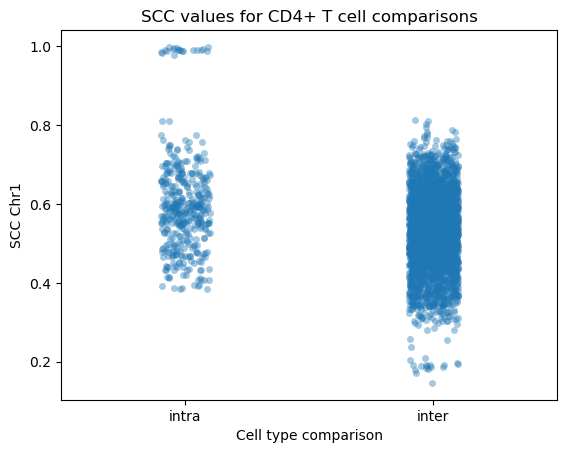

In [3]:
### Visualizing ###
    # Prepping data
scc_results_long = generate_scc_data("CD4+ T cells")

    # Violin plot
sns.stripplot(data=scc_results_long, x="relationship", y="value", alpha=0.4)
plt.title("SCC values for CD4+ T cell comparisons")
plt.xlabel("Cell type comparison")
plt.ylabel("SCC Chr1")

del scc_results_long

## OT

/var/folders/pf/6xtc7fx5435c3f0dbwrdl5tc0000gn/T/ipykernel_51019/2935074636.py:121: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(


array(['CD4+ T cells', 'NK cells', 'Neutrophils', 'T cells', 'Monocytes',
       'B cells', 'CD8+ T cells', 'Progenitors', 'Dendritic cells'],
      dtype=object)

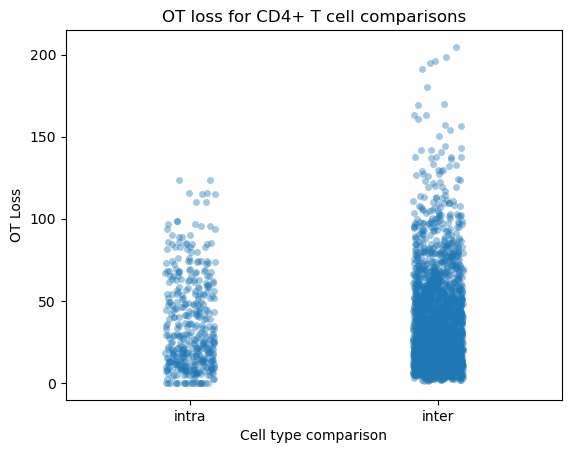

In [11]:
### Visualizing ###
    # Prepping data
ot_results_long = generate_ot_data("CD4+ T cells")

    # Violin plot
sns.stripplot(data=ot_results_long, x="relationship", y="value", alpha=0.4)
plt.title("OT loss for CD4+ T cell comparisons")
plt.xlabel("Cell type comparison")
plt.ylabel("OT Loss")

ot_results_long["col_cell_type"].unique()

## Heatmap SCC
Here, we will calculate the average SCC value for each cell type comparison and generate a heatmap.

In [15]:
### Gathering all data ###
    # Getting all cell types
metadata = pd.read_csv(sc_dir+"/cell_types.tsv", sep='\t')
cell_types = metadata["cell_type"].unique()

    # Looping over cell types
scc_long_dfs = []
for ct in cell_types:
    scc_long_dfs.append(generate_scc_data(ct))

    # Concatenating 
scc_combined_long_df = pd.concat(scc_long_dfs)
scc_combined_long_df["row_cell_type"].unique()

/var/folders/pf/6xtc7fx5435c3f0dbwrdl5tc0000gn/T/ipykernel_51019/2935074636.py:65: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(
/opt/anaconda3/envs/hicotenv/lib/python3.13/site-packages/hicrep/hicrep.py:125: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  assert (cool1.chroms()[:] == cool2.chroms()[:]).all()[0],\
/opt/anaconda3/envs/hicotenv/lib/python3.13/site-packages/hicrep/hicrep.py:125: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, inte

array(['T cells', 'CD4+ T cells', 'CD8+ T cells', 'NK cells', 'B cells',
       'Monocytes', 'Dendritic cells', 'Neutrophils', 'Progenitors'],
      dtype=object)

In [24]:
### Calculating Means ###
scc_mean_matrix = scc_combined_long_df.groupby(
    ['row_cell_type', 'col_cell_type']
)["value"].mean()

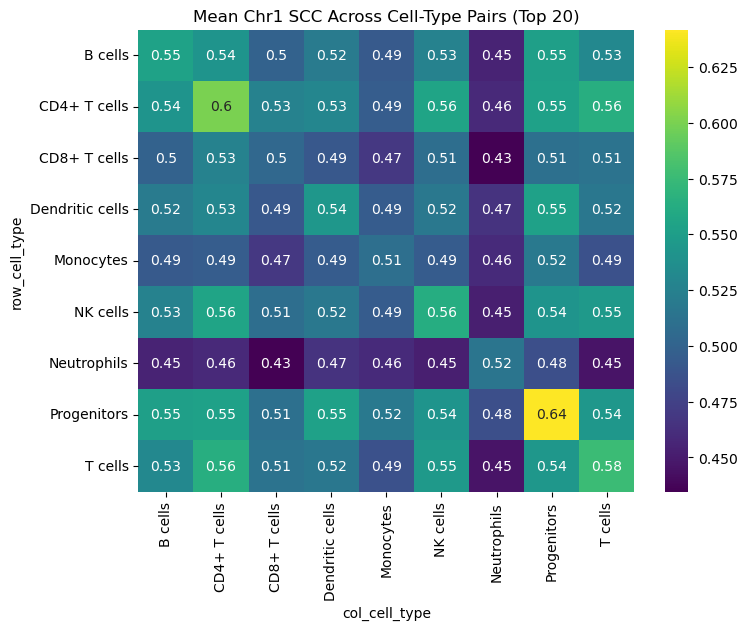

In [26]:
### Heatmap ###
scc_heatmap_df = scc_mean_matrix.unstack()
plt.figure(figsize=(8, 6))
sns.heatmap(scc_heatmap_df, annot=True, cmap='viridis')
plt.title('Mean Chr1 SCC Across Cell-Type Pairs (Top 20)')
plt.show()

## Heatmap OT (8 Mb)

In [4]:
### Gathering all data ###
    # Getting all cell types
metadata = pd.read_csv(sc_dir+"/cell_types.tsv", sep='\t')
cell_types = metadata["cell_type"].unique()

    # Looping over cell types
ot_long_dfs = []
for ct in cell_types:
    ot_long_dfs.append(generate_ot_data(ct))

    # Concatenating 
ot_combined_long_df = pd.concat(ot_long_dfs)
ot_combined_long_df["row_cell_type"].unique()

/var/folders/pf/6xtc7fx5435c3f0dbwrdl5tc0000gn/T/ipykernel_57013/3815585735.py:121: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(
/var/folders/pf/6xtc7fx5435c3f0dbwrdl5tc0000gn/T/ipykernel_57013/3815585735.py:121: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(
/var/folders/pf/6xtc7fx5435c3f0dbwrdl5tc0000gn/T/ipykernel_57013/3815585735.py:121: FutureWarning: DataFra

array(['T cells', 'CD4+ T cells', 'CD8+ T cells', 'NK cells', 'B cells',
       'Monocytes', 'Dendritic cells', 'Neutrophils', 'Progenitors'],
      dtype=object)

In [5]:
### Calculating Means ###
ot_mean_matrix = ot_combined_long_df.groupby(
    ['row_cell_type', 'col_cell_type']
)["value"].mean()

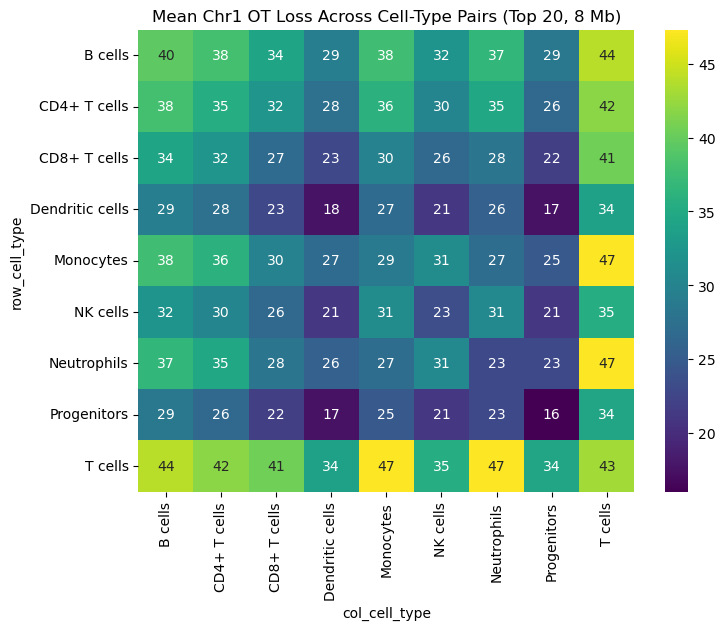

In [6]:
### Heatmap ###
ot_heatmap_df = ot_mean_matrix.unstack()
plt.figure(figsize=(8, 6))
sns.heatmap(ot_heatmap_df, annot=True, cmap='viridis')
plt.title('Mean Chr1 OT Loss Across Cell-Type Pairs (Top 20, 8 Mb)')
plt.show()

## Heatmap OT (4 Mb)

In [36]:
### Gathering all data ###
    # Getting all cell types
metadata = pd.read_csv(sc_dir+"/cell_types.tsv", sep='\t')
cell_types = metadata["cell_type"].unique()

    # Looping over cell types
ot_long_dfs = []
for ct in cell_types:
    ot_long_dfs.append(generate_ot_data(ct, res=4))

    # Concatenating 
ot_combined_long_df = pd.concat(ot_long_dfs)
ot_combined_long_df["row_cell_type"].unique()

/var/folders/pf/6xtc7fx5435c3f0dbwrdl5tc0000gn/T/ipykernel_51019/46891468.py:121: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(
/var/folders/pf/6xtc7fx5435c3f0dbwrdl5tc0000gn/T/ipykernel_51019/46891468.py:121: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(
/var/folders/pf/6xtc7fx5435c3f0dbwrdl5tc0000gn/T/ipykernel_51019/46891468.py:121: FutureWarning: DataFrameGrou

array(['T cells', 'CD4+ T cells', 'CD8+ T cells', 'NK cells', 'B cells',
       'Monocytes', 'Dendritic cells', 'Neutrophils', 'Progenitors'],
      dtype=object)

In [37]:
### Calculating Means ###
ot_mean_matrix = ot_combined_long_df.groupby(
    ['row_cell_type', 'col_cell_type']
)["value"].mean()

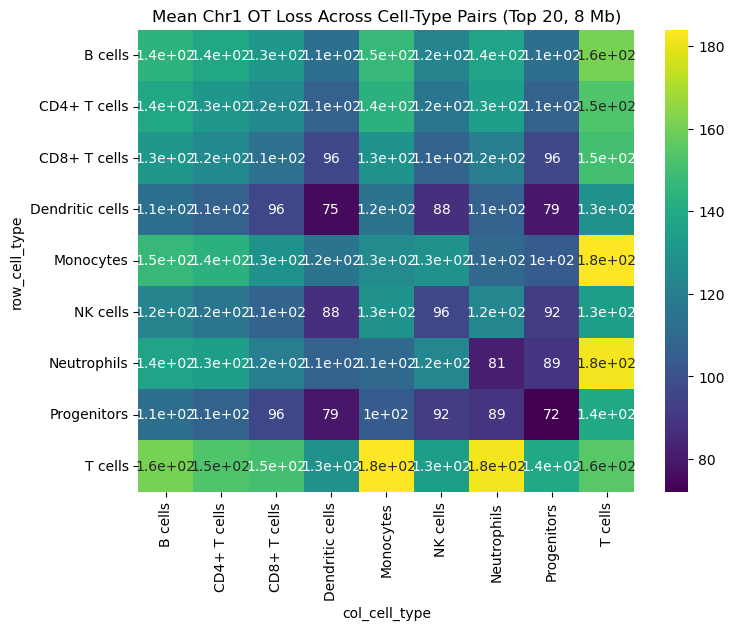

In [38]:
### Heatmap ###
ot_heatmap_df = ot_mean_matrix.unstack()
plt.figure(figsize=(8, 6))
sns.heatmap(ot_heatmap_df, annot=True, cmap='viridis')
plt.title('Mean Chr1 OT Loss Across Cell-Type Pairs (Top 20, 8 Mb)')
plt.show()

## Heatmap OT (2 Mb)

In [39]:
### Gathering all data ###
    # Getting all cell types
metadata = pd.read_csv(sc_dir+"/cell_types.tsv", sep='\t')
cell_types = metadata["cell_type"].unique()

    # Looping over cell types
ot_long_dfs = []
for ct in cell_types:
    ot_long_dfs.append(generate_ot_data(ct, res=2))

    # Concatenating 
ot_combined_long_df = pd.concat(ot_long_dfs)
ot_combined_long_df["row_cell_type"].unique()

/var/folders/pf/6xtc7fx5435c3f0dbwrdl5tc0000gn/T/ipykernel_51019/46891468.py:121: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(
/var/folders/pf/6xtc7fx5435c3f0dbwrdl5tc0000gn/T/ipykernel_51019/46891468.py:121: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(
/var/folders/pf/6xtc7fx5435c3f0dbwrdl5tc0000gn/T/ipykernel_51019/46891468.py:121: FutureWarning: DataFrameGrou

array(['T cells', 'CD4+ T cells', 'CD8+ T cells', 'NK cells', 'B cells',
       'Monocytes', 'Dendritic cells', 'Neutrophils', 'Progenitors'],
      dtype=object)

In [40]:
### Calculating Means ###
ot_mean_matrix = ot_combined_long_df.groupby(
    ['row_cell_type', 'col_cell_type']
)["value"].mean()

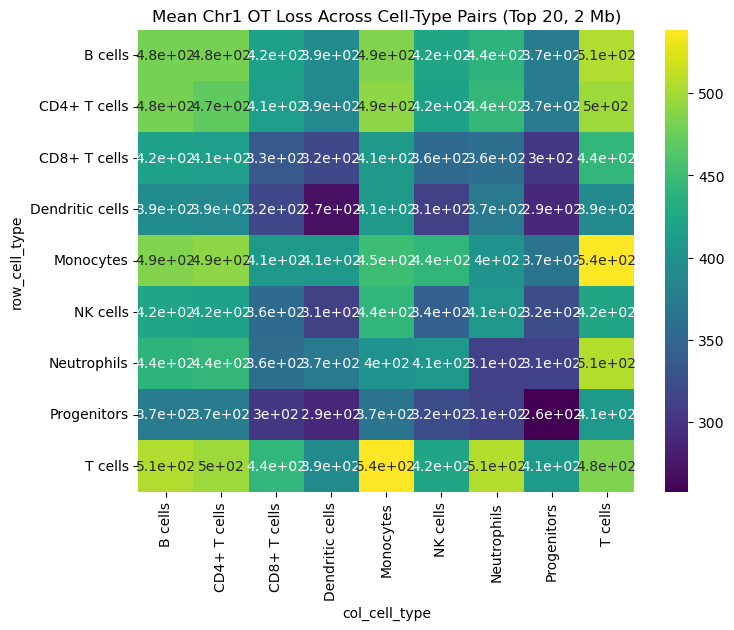

In [42]:
### Heatmap ###
ot_heatmap_df = ot_mean_matrix.unstack()
plt.figure(figsize=(8, 6))
sns.heatmap(ot_heatmap_df, annot=True, cmap='viridis')
plt.title('Mean Chr1 OT Loss Across Cell-Type Pairs (Top 20, 2 Mb)')
plt.show()